In [1]:
!pip install -r requirements.txt

In [54]:
import IPython
from PIL import Image

In [55]:
import os
print(os.getcwd())

C:\Users\ameen\Jupyter\image2audio


In [56]:
from collections import namedtuple

Vector2D = namedtuple("Vector2D", ["x", "y"])

In [57]:
# Change this:
image_name = "Mona_Lisa.jpg"
image_path = f"{os.getcwd()}\images\{image_name}"

In [58]:
def load_image(path):
    return Image.open(path)

In [59]:
def square_image(image : Image, side_length : int) -> Image:
    return image.resize((side_length, side_length))

In [143]:
MAX_FREQUENCY = 10000
MIN_FREQUENCY = 20
MAX_VOLUME = 0.25
def pixel_to_frequency(image : Image, coordinate : Vector2D = Vector2D(0, 0), max_frequency : float = MAX_FREQUENCY, min_frequency : float = MIN_FREQUENCY) -> float:
    R, G, B = image.getpixel(coordinate)
    frequency = (((R + G + B) / (255 * 3)) * (max_frequency - min_frequency)) + min_frequency
    return frequency
    
def pixel_to_volume(image : Image, coordinate : Vector2D = Vector2D(0, 0)) -> float:
    R, G, B = image.getpixel(coordinate)
    volume = ((R + G) / (255 * 2)) * MAX_VOLUME
    return volume


In [174]:
# Change this:
iterations = 5
side_length = 2 ** iterations
print(side_length)
image = load_image(image_path)

32


(32, 32)


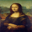

In [175]:
squared_image = square_image(image, side_length)
print(squared_image.size)
IPython.display.display(squared_image)

In [176]:
import math

# L-System from Wolfram:
# Hilbert : ["F" : forward, "+" : Rotate right, "-" : Rotate left]
rules = { "hilbert" : {'axiom' : 'L',\
                       'rules' : {"L" : "+RF-LFL-FR+",\
                                  "R" : "-LF+RFR+FL-"},\
                       'rotation' : math.pi/2}
        }

In [177]:
import copy

# Generate plane-filling curve using an L-system. 
def generate_curve_string(l_system, iterations : int = 1) -> str:
    curr = copy.deepcopy(l_system['axiom'])
    variables = l_system['rules'].keys()
    rules = l_system['rules']
    for i in range(iterations):
        next = ""
        for c in curr:
            if c in variables:
                next += rules[c]
            else:
                next += c
        curr = next
    return curr

In [185]:
# Using hilbert as a plane-filling curve
hilbert_l_system = rules["hilbert"]
generated_curve_string = generate_curve_string(hilbert_l_system, iterations)
#print(generated_curve_string)

In [179]:
def rotate(vector : Vector2D, angle : float) -> Vector2D:
    # rotation matrix
    matrix = [[math.cos(angle) , - math.sin(angle)],\
              [math.sin(angle) ,   math.cos(angle)]]
    xv = Vector2D(vector.x * matrix[0][0], vector.x * matrix[1][0])
    yv = Vector2D(vector.y * matrix[0][1], vector.y * matrix[1][1])
    new_vector = Vector2D(xv.x + yv.x, xv.y + yv.y)
    return new_vector
    
def add(vectorA : Vector2D, vectorB : Vector2D) -> Vector2D:
    return Vector2D(vectorA.x + vectorB.x, vectorA.y + vectorB.y)
    
def round_vector(vector : Vector2D) -> Vector2D:
    return Vector2D(round(vector.x), round(vector.y))
    
def image_to_frequency(image : Image, curve_string : str) -> list[list[float], list[float], list[Vector2D]]:
    frequencies = []
    volumes = []
    points = []
    current_position = Vector2D(0, 0)
    heading_vector = Vector2D(1, 0)
    variables = hilbert_l_system['rules'].keys()
    angle = hilbert_l_system['rotation']
    for element in curve_string:
        if(element in ['+', '-']):
            if(element == '+'):
                heading_vector = rotate(heading_vector, -angle)
                heading_vector = round_vector(heading_vector)
            if(element == '-'):
                heading_vector = rotate(heading_vector, angle)
                heading_vector = round_vector(heading_vector)
        if(element not in variables):
            if(element == 'F'):
                #print("frequency at ", "({},{})".format(current_position.x, current_position.y), " : ",\
                #      pixel_to_frequency(image, current_position))
                frequencies.append(pixel_to_frequency(image, current_position))
                volumes.append(pixel_to_volume(image, current_position))
                current_position = add(current_position, heading_vector)
                points.append(current_position)
                #print("current position", current_position)
    return [frequencies, volumes, points]


In [180]:
frequencies, volumes, points = image_to_frequency(squared_image, generated_curve_string)

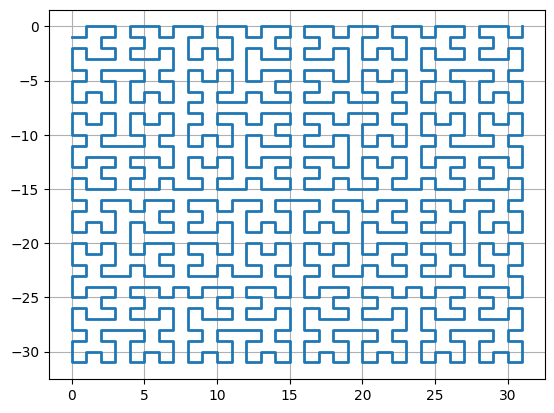

In [181]:
# Curve visualisation:
import matplotlib.pyplot as plt
import numpy as np

x_points = np.array([p.x for p in points])
y_points = np.array([p.y for p in points])

plt.plot(x_points, y_points, linewidth = 2.0)
plt.grid(True)
plt.show()

In [182]:
import pyaudio
import array

p = pyaudio.PyAudio()

# Samples per second
SAMPLE_RATE = 144000
TOTAL_DURATION = 20
TONE_DURATION = TOTAL_DURATION / (side_length ** 2)
FADE_FACTOR = 1

# Frequency : Hz
# Duration  : Seconds
def create_tone(frequency : float, volume : int = 1, duration : float = TONE_DURATION, sample_rate : int = SAMPLE_RATE) -> bytes:
    n_samples = int(sample_rate * duration)
    samples = [volume * math.sin(2 * math.pi * k * frequency / sample_rate) for k in range(0, n_samples)]
    fade_out_samples(samples)
    data = array.array('f', samples).tobytes()
    return data

def fade_out_samples(samples : list[float], n_frames : int = int(SAMPLE_RATE * TONE_DURATION * FADE_FACTOR) ) -> None:
    for i in range(n_frames):
        samples[-i - 1] *= (i / n_frames) ** 3

def frequencies_to_audio(frequencies : list[float], volumes : list[float]) -> bytes:
    tone_list = []
    for i in range(len(frequencies)):
        tone_list.append(create_tone(frequencies[i], volumes[i]))
    final_data = b''.join(tone_list)
    return final_data

In [183]:
import wave

audio_data = frequencies_to_audio(frequencies, volumes)

output_folder = "output_audio"
audio_file_path = "{}/audput.wav".format(output_folder)

CHANNELS = 1

wf = wave.open(audio_file_path, 'wb')
wf.setnchannels(CHANNELS)
# Bytes per sample
wf.setsampwidth(4)
wf.setframerate(SAMPLE_RATE)
wf.writeframes(audio_data)
wf.close()

In [184]:
# Beware sound might get loud
from IPython.display import Audio 
Audio(audio_file_path, autoplay=True)